 <p style="margin: 0; padding: 0; background-color: black; color: white; text-align: left; font-size: 2em; padding: 20px;">
  Exploratory Data Analysis </p>
  

## Load Important Libraries and Data

In [1]:
# import the important libraries
import pandas as pd
import numpy as np

# data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import bokeh

# Ignore all warnings
import warnings
warnings.filterwarnings('ignore')

# load the data
df = pd.read_excel(r'C:\Users\MohammedR\Desktop\IABAC PROJECT\data\processed\INX_future_inc_employee_cleaned_dataset.xlsx')

# loading bokeh
from bokeh.plotting import output_notebook, show, output_file, save
output_notebook() #to display the graphs directly on jupyter notebook.

Loading BokehJS ...

In [2]:
df.head()

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,...,4,10,2,2,10,7,0,8,No,3
1,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,...,4,20,2,3,7,7,1,7,No,3
2,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,...,3,20,2,3,18,13,1,12,No,4
3,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,...,2,23,2,2,21,6,12,6,No,3
4,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,...,4,10,1,3,2,2,2,2,No,3


## Data Exploration

In [3]:
# getting names for features of all data type
print("Numerical Features: ", list(df.select_dtypes(['int64', 'float64']).columns), end="\n\n")
print("Categorical Features: ", list(df.select_dtypes(['object','bool']).columns), end="\n\n")
print("Target Label: ", "PerformanceRating")

Numerical Features:  ['Age', 'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel', 'EmpJobSatisfaction', 'NumCompaniesWorked', 'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction', 'TotalWorkExperienceInYears', 'TrainingTimesLastYear', 'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'PerformanceRating']

Categorical Features:  ['Gender', 'EducationBackground', 'MaritalStatus', 'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition']

Target Label:  PerformanceRating


In [4]:
df.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


## Univariate Analysis

Univariate analysis serves as an essential first step in exploring and understanding the characteristics of individual variables before moving on to more complex multivariate analyses, where relationships between multiple variables are considered.

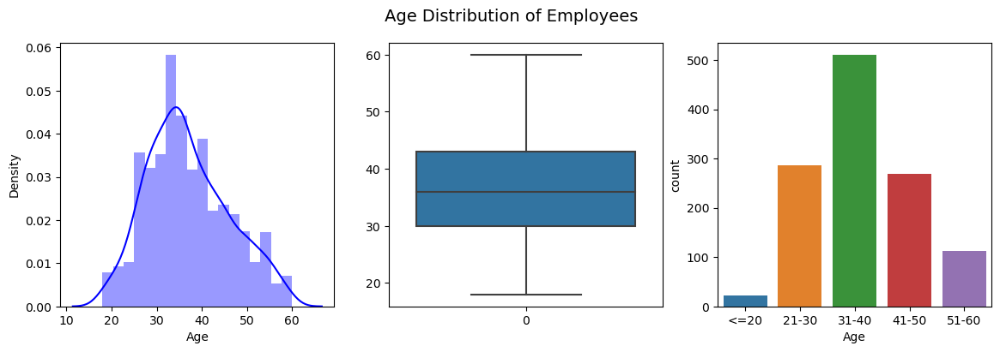

In [5]:
# bin the ages for proper count
binned_age = pd.cut(df.Age, bins=[0, 20,30, 40, 50, 60], labels=[ "<=20", "21-30", "31-40", "41-50", "51-60"])

# plot three figures to completely describe the distribution of Age
fig, axes = plt.subplots(1,3, figsize=(14,4), 
                       sharex=False, sharey=False, squeeze=False)

fig.suptitle(' Age Distribution of Employees ', fontsize=14)
sns.distplot(df.Age, ax=axes[0,0], color="blue")
sns.countplot(x=binned_age)
sns.boxplot(df.Age, ax=axes[0,1])
plt.show()

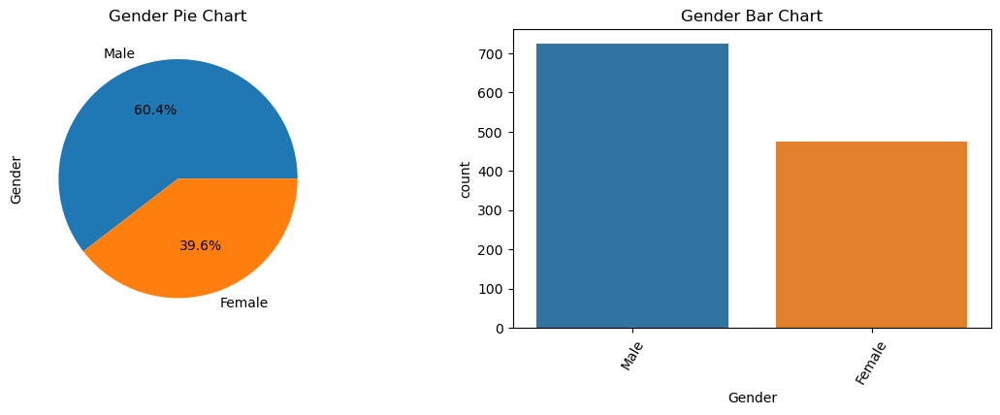

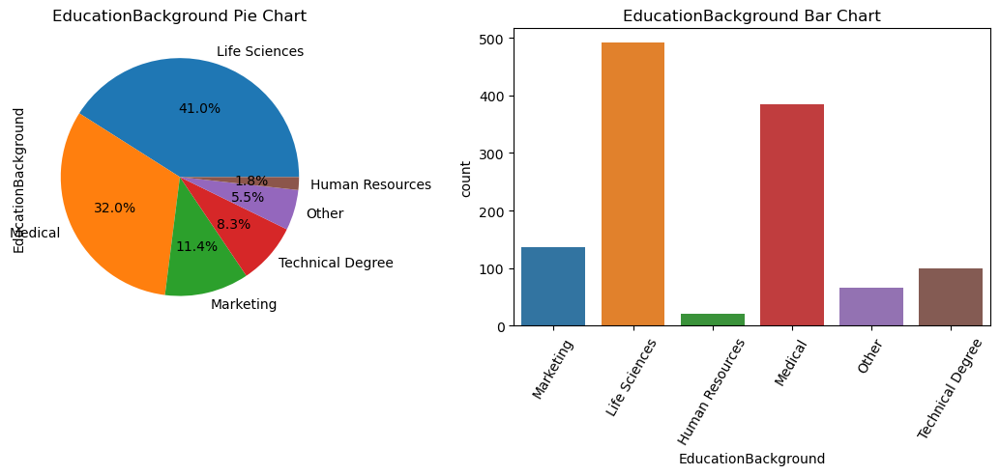

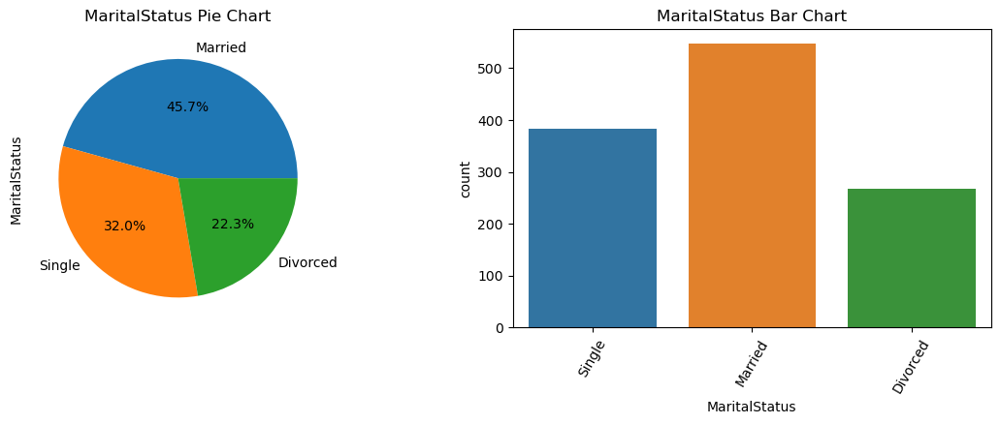

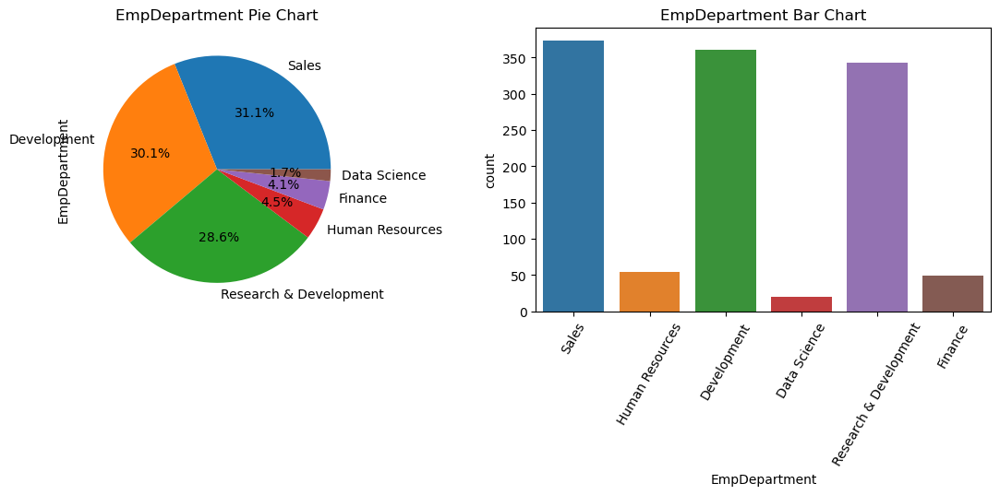

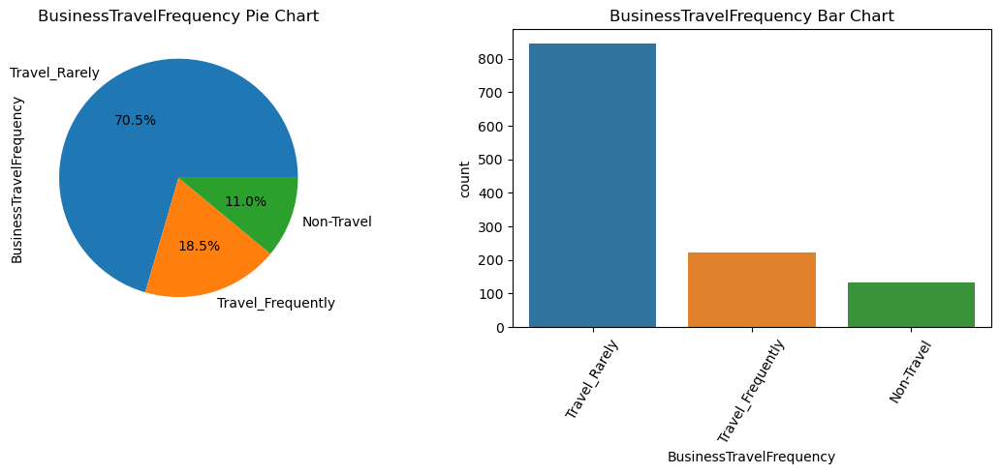

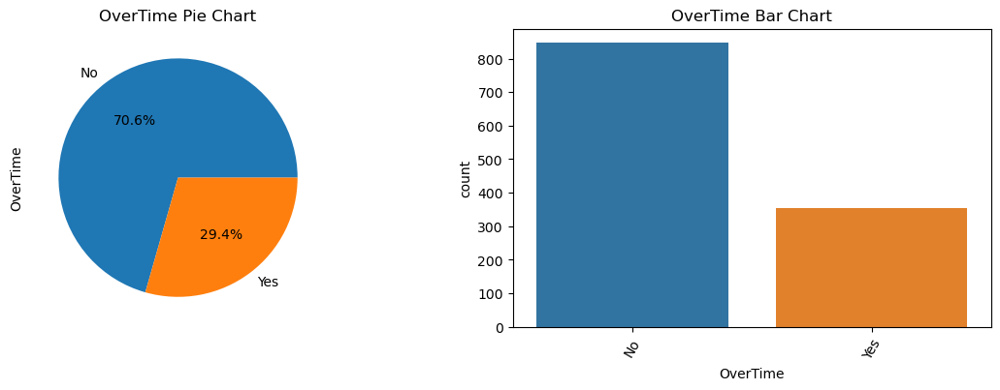

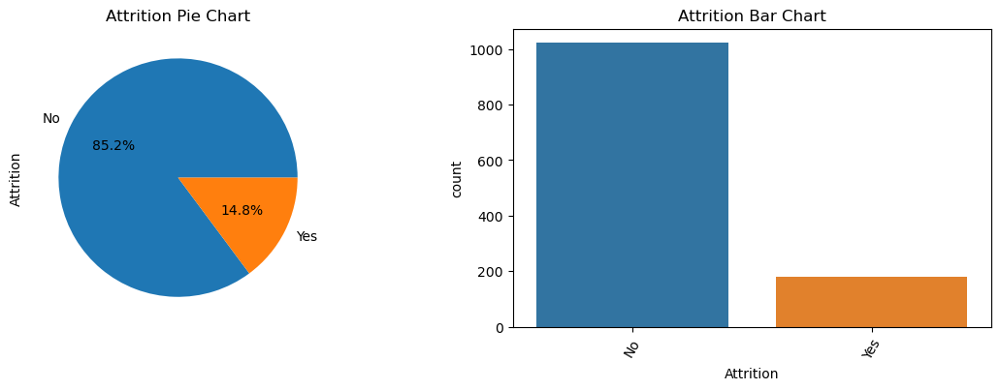

In [6]:
def plot_pie_bar_counts(i, data=df):
    plt.figure(figsize=(14,4))
    plt.subplot(1,2,1)
    data[i].value_counts().plot.pie(autopct="%1.1f%%")
    plt.title(f"{i} Pie Chart")
    plt.subplot(1,2,2)
    sns.countplot(x=i, data=data)
    plt.xticks(rotation=60)
    data[i].value_counts()
    plt.title(f"{i} Bar Chart")
    plt.show()
    
for i in df:
    if df[i].dtype in ['object','bool']:
        if i not in ["EmpJobRole", "EmpNumber"]:
            plot_pie_bar_counts(i, data=df)

In [7]:
!pip install ydata-profiling

In [8]:
# For our futher univariate analysis of numerical features we shall conveniantly use pandas ydata-profiling
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### CONCLUSION OF DEA PART

#### Categorical features
1. Gender distribution: __60.4%__ male (725) and __39.6%__ female (475)<br>
2. Education Background:
    * Life sciences: __41%__ (492)
    * Medical: __32%__ (384)
    * Marketing: __11.4%__ (137)
    * Technical Degree: __8.3%__ (100)
    * Human Resources: __1.8%__ (21)
    * Others: __5.5%__ (66)
3. Marital Status : 
    * single : __45.7%__ (584)
    * Married : __32%__ (384)
    * Divorced : __22.3%__ (268)
4. Employee Department:
    * __31.1%__ of the people work in sales (373)
    * __30.1%__ of the people work in Development (361)
    * __28.6%__ of people work in Research and development (343)
    * __4.5%__ in HR (54)
    * __4.1%__ in Finance (49)
    * __1.7%__ in Data Science (20)
<br>
5. There are <b>19</b> Unique Employee Job Roles in the organization with __22.5%__ Employees working as Sales executive counting as the highest number of employees in any role followed by Developers which are at __19.7%__ followed by the rest with each role not exceeding __8%__ of the total employees
<br>
6. Out the given population only __18.5%__ of the employee's travel frequently, __70.5%__ of employees do still travel although rarely and the rest do not travel
<br>
7. __29.4%__ of employees do Overtime
<br>
8. __85.2%__ employees does not have attrition

#### Numerical features
1. The age distribution here can be considered gaussian given its skewness and kurtosis ranging in __|1.96|__
2. The highest number of employees fall in the age group of __30__ to __45__.
3. The most common education level among employees is __3__ or as described in the data definitions __Bachelors__
4. The two most common employee environment satisfaction rates are __3__ and __4__ i.e. __high__ and __very high__ so the environment of the company seems highly satisfactory for the employees
5. The mean hourly rate is __65.98__ with most of the employees earning between the range of 60 to 95
6. The most common job involvement rating is 3 i.e. __high__ so the employees at this company have a good Job Involvement rate
7. The distribution also states that around __72%__ of the employees are in the preliminary job roles of 1 and 2
8. Around __60%__ of the employees are __highly__ or __very highly__ satisfied with their jobs

## Bivariate Analysis

Bivariate analysis is a fundamental step in exploring the connections between variables, laying the groundwork for more advanced multivariate analyses that involve three or more variables.

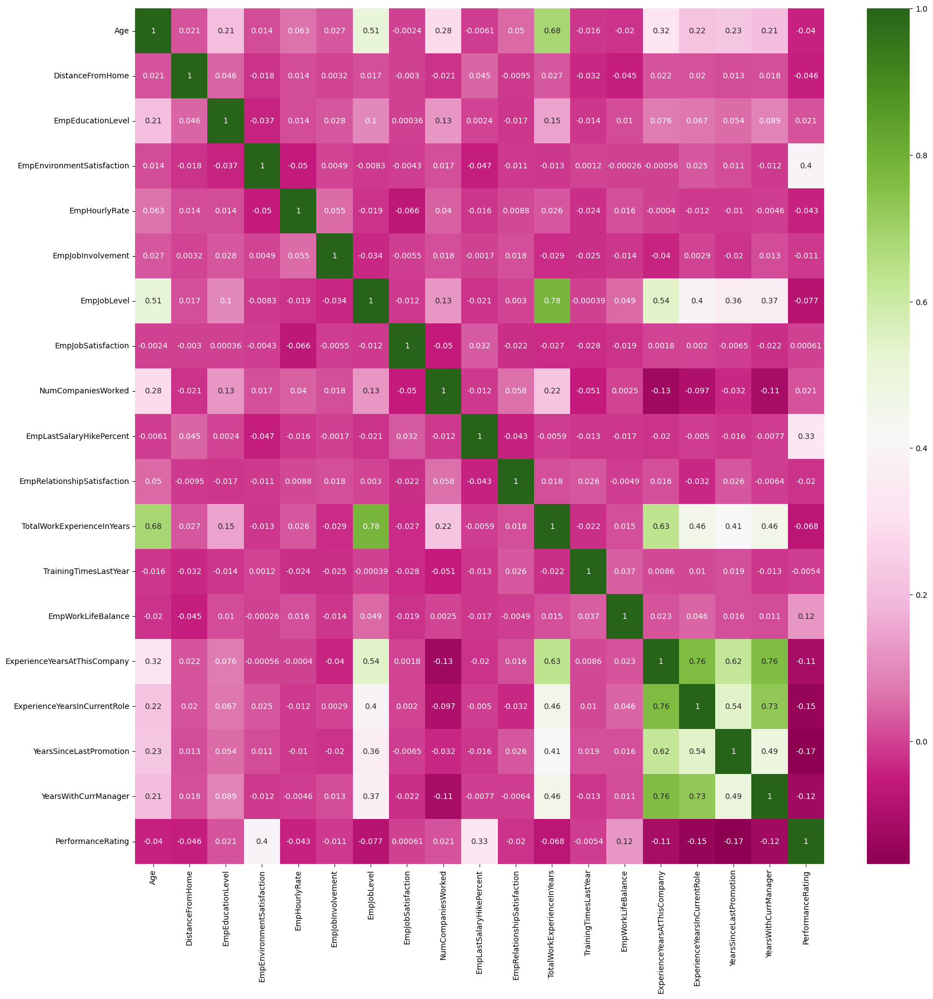

In [15]:
# Making a heatmap to gather correlation of numerical features with each other
plt.figure(figsize=(20,20))

sns.heatmap(
    df.select_dtypes(['int64','float64']).corr(), 
    cmap='PiYG',
    annot=True
)
plt.show()

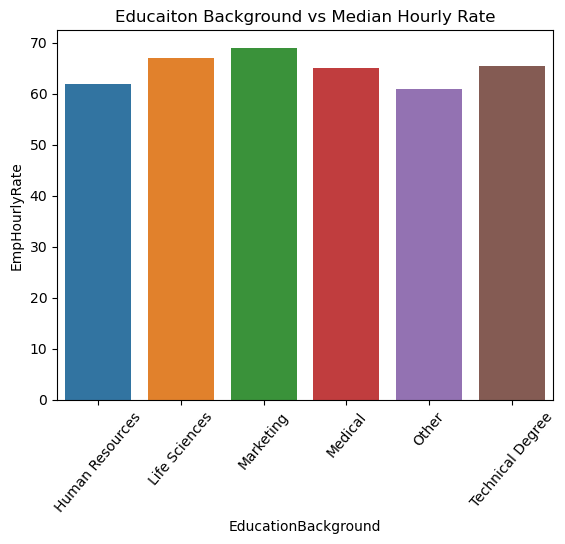

In [23]:
# Edcuation Background vs Median Hourly Rate

eb_hr_df = df.groupby('EducationBackground')['EmpHourlyRate'].median().reset_index()

sns.barplot(x=eb_hr_df['EducationBackground'], y=eb_hr_df['EmpHourlyRate']) 
plt.xticks(rotation=50)
plt.title("Educaiton Background vs Median Hourly Rate")
plt.show()

## Data distribution visualized for EDA and Inferences

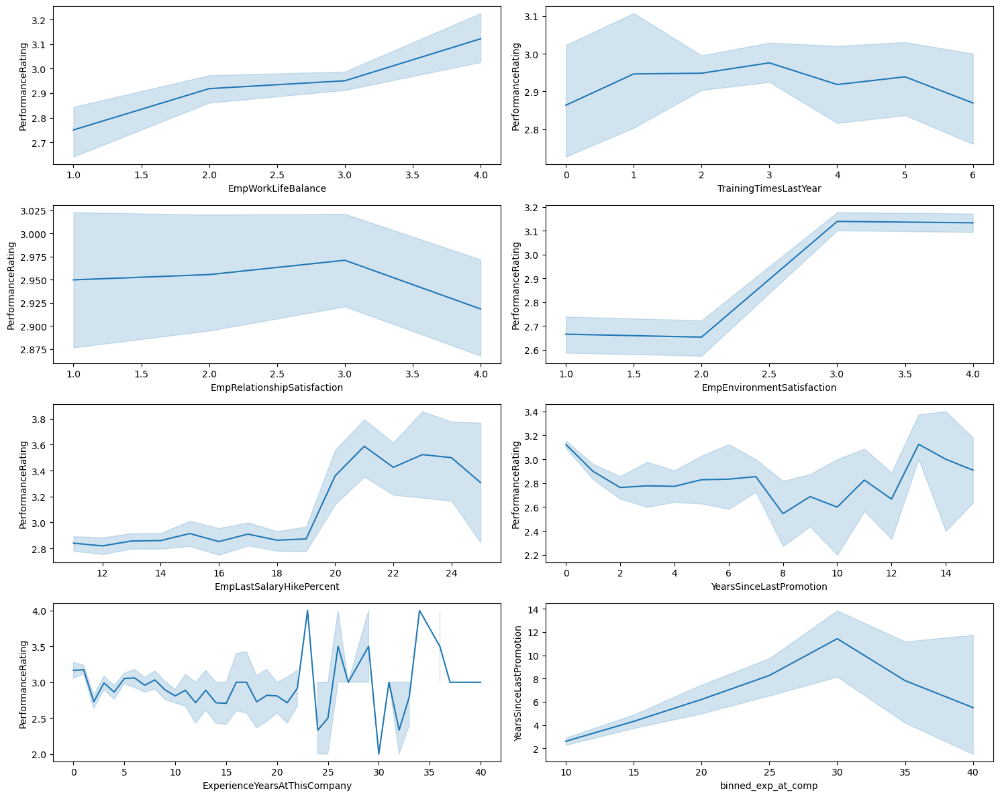

In [25]:
fig, ax = plt.subplots(4,2,figsize=(15, 12))
plt.subplots_adjust(
    top=1,
    bottom=0.2
)

x = df.sort_values('EmpWorkLifeBalance')
sns.lineplot(x="EmpWorkLifeBalance", y="PerformanceRating", ax=ax[0,0], data=x)

x = df.sort_values('TrainingTimesLastYear')
sns.lineplot(x="TrainingTimesLastYear", y="PerformanceRating", ax=ax[0,1], data=x)

x = df.sort_values('EmpRelationshipSatisfaction')
sns.lineplot(x="EmpRelationshipSatisfaction", y="PerformanceRating", ax=ax[1,0], data=x)

x = df.sort_values('EmpEnvironmentSatisfaction')
sns.lineplot(x="EmpEnvironmentSatisfaction", y="PerformanceRating", ax=ax[1,1], data=x)

x = df.sort_values('EmpLastSalaryHikePercent')
sns.lineplot(x="EmpLastSalaryHikePercent", y="PerformanceRating", ax=ax[2,0], data=x)

x = df.sort_values('YearsSinceLastPromotion')
sns.lineplot(x="YearsSinceLastPromotion", y="PerformanceRating", ax=ax[2,1], data=x)

x = df.sort_values('ExperienceYearsAtThisCompany')
sns.lineplot(x="ExperienceYearsAtThisCompany", y="PerformanceRating", ax=ax[3,0], data=x)

binned_exp = pd.cut(df.ExperienceYearsAtThisCompany, bins=[5, 10 ,15, 20, 25, 30, 35, 40]\
                   ,labels=[10, 15, 20, 25, 30 ,35, 40])
x = df
x['binned_exp_at_comp'] = binned_exp
sns.lineplot(x='binned_exp_at_comp',y="YearsSinceLastPromotion", ax=ax[3,1], data=x)

fig.tight_layout()

### Inference from the Kernal Density Estimate and LinePlots

1. The better the employee's worklife balance the better he/she performs
2. Trainings should be kept at a moderate amount as a very high amount of training is resulting in reducing employee performance
3. The Employee relationship should be kept in control and not very low or very high as that affects the performance rating of the employee
4. The higher the environment satisfaction the higher is the employee performance 
5. Employees with salary hike above 20 % tend to have a drastic increase in their performance

In [31]:
correlation_matrix = df.select_dtypes(['int64', 'float64']).corr()

# Set the correlation threshold
threshold = 0.7

# Filter the correlation matrix
high_correlation_matrix = correlation_matrix[correlation_matrix.abs() > threshold]

# Display the filtered correlation matrix
print(high_correlation_matrix)


                              Age  DistanceFromHome  EmpEducationLevel  \
Age                           1.0               NaN                NaN   
DistanceFromHome              NaN               1.0                NaN   
EmpEducationLevel             NaN               NaN                1.0   
EmpEnvironmentSatisfaction    NaN               NaN                NaN   
EmpHourlyRate                 NaN               NaN                NaN   
EmpJobInvolvement             NaN               NaN                NaN   
EmpJobLevel                   NaN               NaN                NaN   
EmpJobSatisfaction            NaN               NaN                NaN   
NumCompaniesWorked            NaN               NaN                NaN   
EmpLastSalaryHikePercent      NaN               NaN                NaN   
EmpRelationshipSatisfaction   NaN               NaN                NaN   
TotalWorkExperienceInYears    NaN               NaN                NaN   
TrainingTimesLastYear         NaN     

### Inference from the corr() method

1. The highly correlated features are TotalYearsOfExperience and EmpJobLevel with __0.78%__
2. ExperienceYearsInCurrentRole, ExperienceYearsAtThisCompany and ExperienceYearsInCurrentRole, YearsWithCurrManager are also subsequently highly correlated with a range of [__0.72%__ to __0.76%__]
3. There is also a considerable correlation between ExperienceYearsAtThisCompany and YearsSinceLastPromotion (__0.62%__) although from the subsequent heatmaps and Line Charts is clear that someone with experience higher than 35 years with this company or someone as new as having less than 15 years with this company is likely to get a promotion as compared to someone who has been associated with the company for more than 20 or less than 35 years